## Computer Vision

### Part 1 

### DOMAIN: 
Botanical research

### CONTEXT: 
University X is currently undergoing some research involving understanding the characteristics of
flowers. They already have have invested on curating sample images. They require an automation which can
create a classifier capable of determining a flower’s species from a photo

### DATA DESCRIPTION: 
The dataset comprises of images from 17 plant species. It can be downloaded from
TensorFlow [ Hint: import tflearn.datasets.oxflower17 as oxflower17 ]

### PROJECT OBJECTIVE: 
Company’s management requires an automation which can create a classifier capable of
determining a flower’s species from a photo

### Steps and tasks: 
#### 1. Import the data. Analyse the dimensions of the data.
#### 2. Preprocess the data.
#### 3. Data visualisation:
• Display the images
• Display the labels
• Display images vs labels
• Apply different filters [ for example: blur, contour, edge detection, emboss, smooth etc.] on the images and
display the image.
#### 4. Train tune and test AIML image classifier model using:
• Use supervised learning algorithms for training
• Use neural networks for training
• Use CNN for training
• Use various CNN with transferred learning models for training
• Compare the results from the above step along with your detailed observations.


### Part 2

Explain in depth your strategy to maintain and support the AIML image classifier after it in production.

# <font color=blue>AIML Module Project - CNN - Project 2</font>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
from sklearn import metrics
import tensorflow as tf
import tensorflow_datasets as tfdatasets
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.initializers import HeUniform,HeNormal
from keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from keras.models import model_from_json
from random import randint
from PIL.ImageFilter import ( BLUR, 
                             CONTOUR, 
                             DETAIL, 
                             EDGE_ENHANCE, 
                             EDGE_ENHANCE_MORE,
                             EMBOSS, 
                             FIND_EDGES, 
                             SMOOTH, 
                             SMOOTH_MORE, 
                             SHARPEN )
import cv2
from sklearn.naive_bayes import MultinomialNB
import random
from sklearn.utils import shuffle
from PIL import Image , ImageFilter
import os
from glob import glob
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score, confusion_matrix

import warnings
warnings.filterwarnings('ignore')

In [2]:
pip install tflearn

     |████████████████████████████████| 107 kB 3.8 MB/s eta 0:00:01
  Created wheel for tflearn: filename=tflearn-0.5.0-py3-none-any.whl size=127299 sha256=441143691eee60d1438cac52dd8e345be3f852fd285e4a8934d16363ad55f644
  Stored in directory: /root/.cache/pip/wheels/5f/14/2e/1d8e28cc47a5a931a2fb82438c9e37ef9246cc6a3774520271
Successfully built tflearn


In [3]:
import tflearn.datasets.oxflower17 as oxflower17
X, y = oxflower17.load_data(one_hot=False)  

Instructions for updating:
non-resource variables are not supported in the long term


100.0% 60276736 / 60270631


Succesfully downloaded 17flowers.tgz 60270631 bytes.
File Extracted
Starting to parse images...
Parsing Done!


##### <font color=blue>Analyzing Shape</font>

In [4]:
print(X.shape)
print(y.shape)

(1360, 224, 224, 3)
(1360,)


##### <font color=blue>Set the project path</font>

In [4]:
project_path = "/content/17flowers/jpg"
os.chdir(project_path)

##### <font color=blue>Checking directory</font>

In [6]:
os.listdir()

['12',
 '7',
 '16',
 '14',
 '2',
 '3',
 '5',
 'files.txt',
 'files.txt~',
 '6',
 '8',
 '4',
 '11',
 '0',
 '10',
 '1',
 '15',
 '9',
 '13']

##### <font color=blue>Removing Unecessary Files</font>

In [5]:
dir = os.listdir()
dir.remove("files.txt")
dir.remove("files.txt~")
print(dir)

['12', '7', '16', '14', '2', '3', '5', '6', '8', '4', '11', '0', '10', '1', '15', '9', '13']


##### <font color=blue>Setting some params</font>

In [6]:
img_size = 224
img_depth = 3
X_new =[]
y_new = []

##### <font color=blue>Loading Data From Current Directory</font>

In [7]:
for i in dir:  
  for j in os.listdir(i):
    print(project_path + '/' + i + '/' + j)
    temp = cv2.imread(project_path + '/' + i + '/' + j)
    temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)
    temp_resize = cv2.resize(temp, (img_size, img_size))
    X_new.append(temp_resize)
    y_new.append(i)

/content/17flowers/jpg/12/image_1027.jpg
/content/17flowers/jpg/12/image_0976.jpg
/content/17flowers/jpg/12/image_0970.jpg
/content/17flowers/jpg/12/image_0966.jpg
/content/17flowers/jpg/12/image_1009.jpg
/content/17flowers/jpg/12/image_0963.jpg
/content/17flowers/jpg/12/image_0979.jpg
/content/17flowers/jpg/12/image_1025.jpg
/content/17flowers/jpg/12/image_0980.jpg
/content/17flowers/jpg/12/image_0967.jpg
/content/17flowers/jpg/12/image_1024.jpg
/content/17flowers/jpg/12/image_0986.jpg
/content/17flowers/jpg/12/image_1010.jpg
/content/17flowers/jpg/12/image_0962.jpg
/content/17flowers/jpg/12/image_0977.jpg
/content/17flowers/jpg/12/image_1038.jpg
/content/17flowers/jpg/12/image_0999.jpg
/content/17flowers/jpg/12/image_1016.jpg
/content/17flowers/jpg/12/image_0971.jpg
/content/17flowers/jpg/12/image_0996.jpg
/content/17flowers/jpg/12/image_1012.jpg
/content/17flowers/jpg/12/image_0982.jpg
/content/17flowers/jpg/12/image_0983.jpg
/content/17flowers/jpg/12/image_0991.jpg
/content/17flowe

##### <font color=blue>Converting To Array</font>

In [8]:
X_new = np.array(X_new)
print("Shape of data : ", X_new.shape)

Shape of data :  (1360, 224, 224, 3)


In [9]:
y_new = np.array(y_new)
print("Shape of labels : ", y_new.shape)

Shape of labels :  (1360,)


In [10]:
print("Single Image Size : ", X_new[0].shape)

Single Image Size :  (224, 224, 3)


In [11]:
y_new[:5]

array(['12', '12', '12', '12', '12'], dtype='<U2')

### <font color=blue>2. Preprocess the data.</font>

##### <font color=blue>Splitting the data into training and testing</font>

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size=0.2, shuffle = True, random_state = 7, stratify = y_new)

In [13]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(1088, 224, 224, 3)
(1088,)
(272, 224, 224, 3)
(272,)


##### <font color=blue>Random Shuffle Data</font>

In [14]:
X_train, y_train = shuffle(X_train, y_train)

##### <font color=blue>OutPut Classes</font>

In [15]:
classes = np.unique(y)
nClasses = len(classes)
print('Total number of outputs : ', nClasses)
print('Output classes : ', classes)

Total number of outputs :  17
Output classes :  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]


##### <font color=blue>One Hot Encoding</font>

In [16]:
y_train = tf.keras.utils.to_categorical(y_train, nClasses) 
y_test = tf.keras.utils.to_categorical(y_test, nClasses)

##### <font color=blue>Normalize Data</font>

In [17]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_test /= 255

##### <font color=blue>Reshaping Data</font>

In [18]:
X_train = X_train.reshape(X_train.shape[0], img_size, img_size, img_depth) 
X_test = X_test.reshape(X_test.shape[0], img_size, img_size, img_depth)

##### <font color=blue>Print final shape and size of Train and Test data</font>

In [19]:
print(' Train data : ', X_train.shape, y_train.shape)
print(' Test data : ', X_test.shape, y_test.shape)

 Train data :  (1088, 224, 224, 3) (1088, 17)
 Test data :  (272, 224, 224, 3) (272, 17)


### <font color=blue>3. Data visualisation</font>

##### <font color=blue>Display Single Image</font>

Image width: 666
Image height: 500


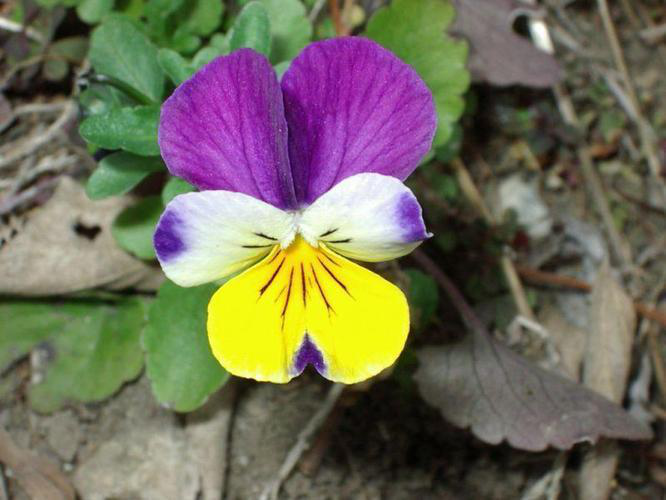

In [22]:
Image_name = "/content/17flowers/jpg/16/image_1340.jpg"   
with Image.open(Image_name) as image: 
    width, height = image.size
print("Image width:",width)
print("Image height:",height)
Image.open(Image_name)

##### <font color=blue>Display Multiple Images</font>

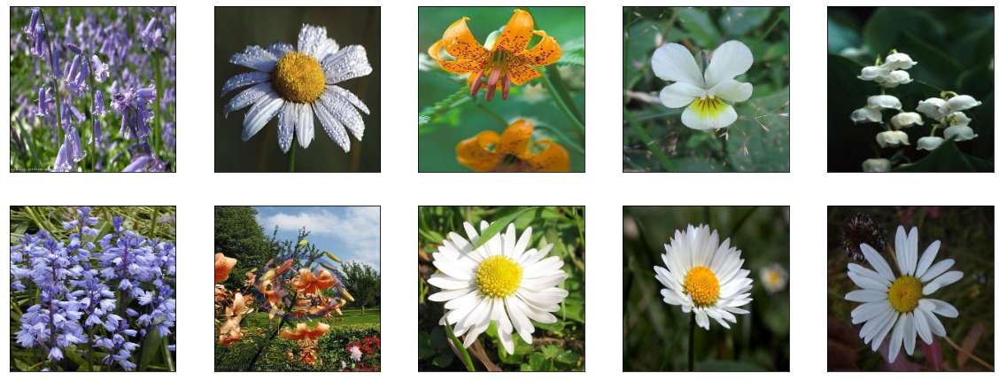

In [23]:
plt.figure(figsize = (20, 20))     
for i in range(10):
    value = randint(0, 1360)
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(True)
    plt.imshow(X_new[value], cmap = plt.cm.binary)

##### <font color=blue>Display the labels</font>

In [20]:
labels=np.unique(y_new)

##### <font color=blue>Sorting</font>

In [21]:
labels_new = []
for i in range(0, len(labels)): 
  labels_new.append(int(labels[i]))

labels_new.sort()
print(labels_new)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]


In [22]:
flower_classes = ['Daffodil','Snowdrop','LilyValley','Bluebell','Crocus','Iris','Tigerlily','Tulip','Fritillary','Sunflower','Daisy','ColtisFoot','Dandelion','Cowslip','Buttercup','Windflower','Pansy']

##### <font color=blue>Creating Dictionary</font>

In [23]:
Labels = {labels_new[i]: flower_classes[i] for i in range(len(labels_new))}   
print ("Labels  : " +  str(Labels))

Labels  : {0: 'Daffodil', 1: 'Snowdrop', 2: 'LilyValley', 3: 'Bluebell', 4: 'Crocus', 5: 'Iris', 6: 'Tigerlily', 7: 'Tulip', 8: 'Fritillary', 9: 'Sunflower', 10: 'Daisy', 11: 'ColtisFoot', 12: 'Dandelion', 13: 'Cowslip', 14: 'Buttercup', 15: 'Windflower', 16: 'Pansy'}


##### <font color=blue>Display the labels</font>

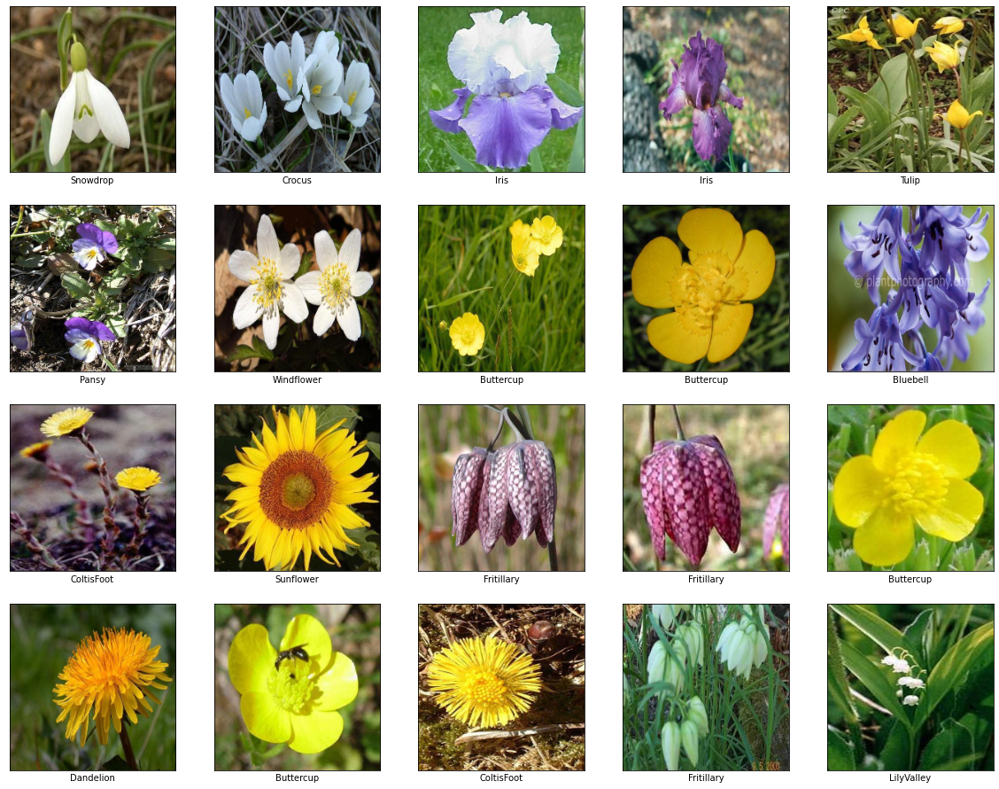

In [24]:
plt.figure(figsize=(20,20))  
for i in range(20):
    value = randint(0,1360)
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(True)
    plt.imshow(X_new[value],cmap=plt.cm.binary)
    plt.xlabel(Labels[int(y_new[value])])

##### <font color=blue>Apply different filters [ for example: blur, contour, edge detection, emboss, smooth etc.] on the images and display the image.</font>

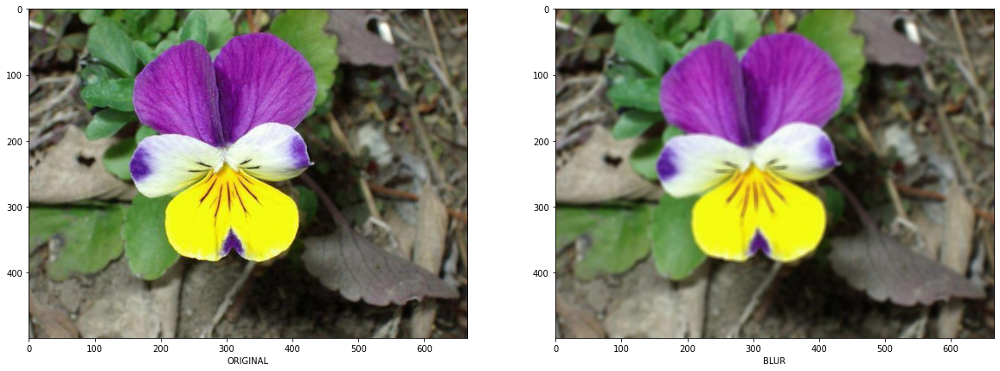

In [29]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(BLUR)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('BLUR')
plt.show()

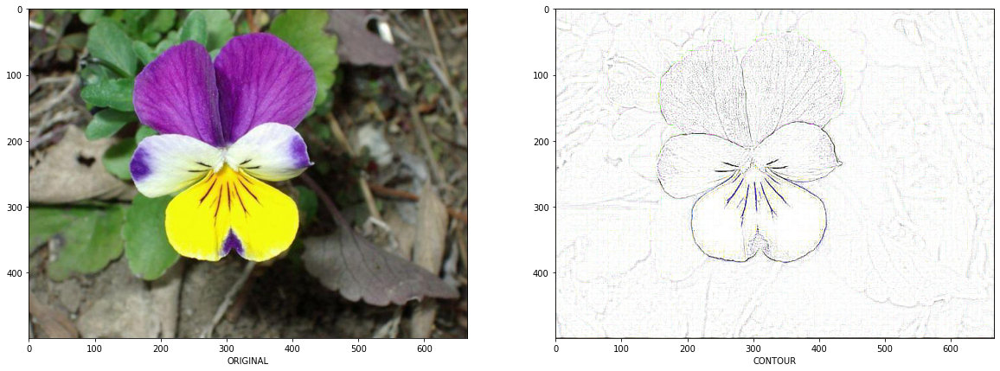

In [30]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(CONTOUR)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('CONTOUR')
plt.show()

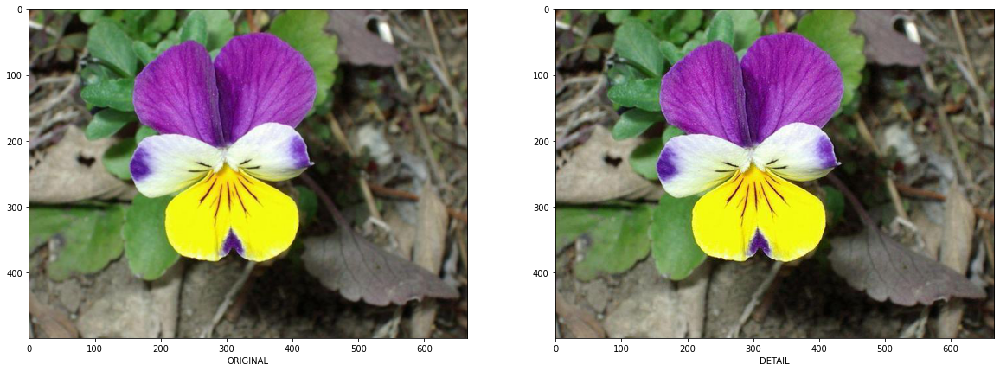

In [31]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(DETAIL)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('DETAIL')
plt.show()

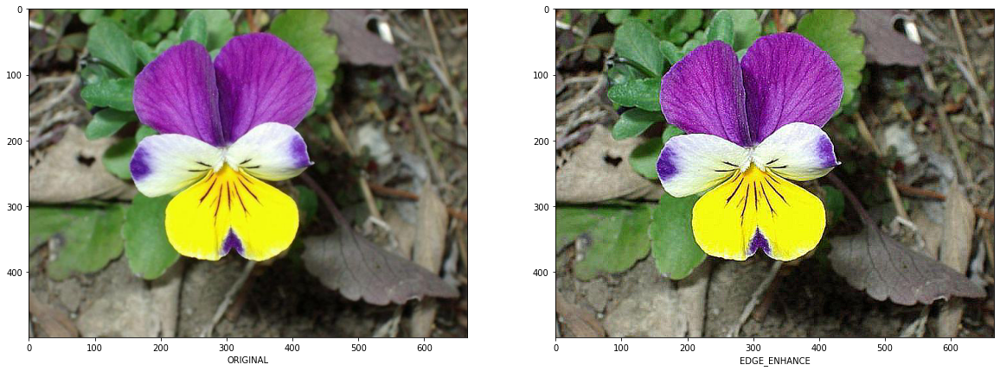

In [32]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(EDGE_ENHANCE)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('EDGE_ENHANCE')
plt.show()

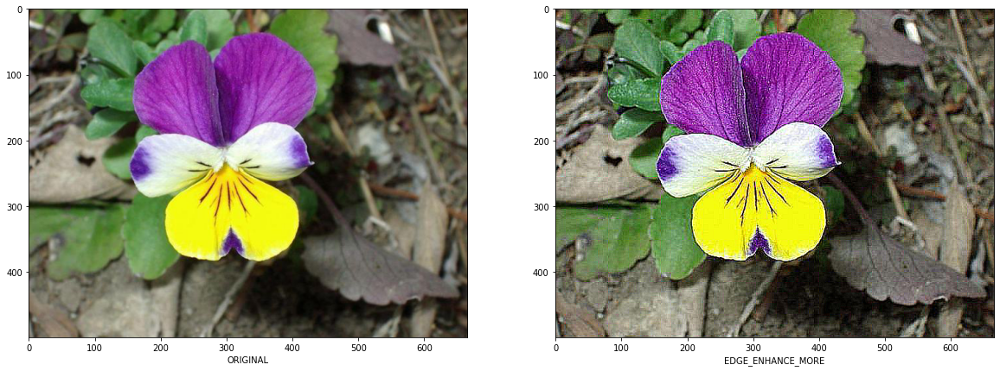

In [33]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(EDGE_ENHANCE_MORE)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('EDGE_ENHANCE_MORE')
plt.show()

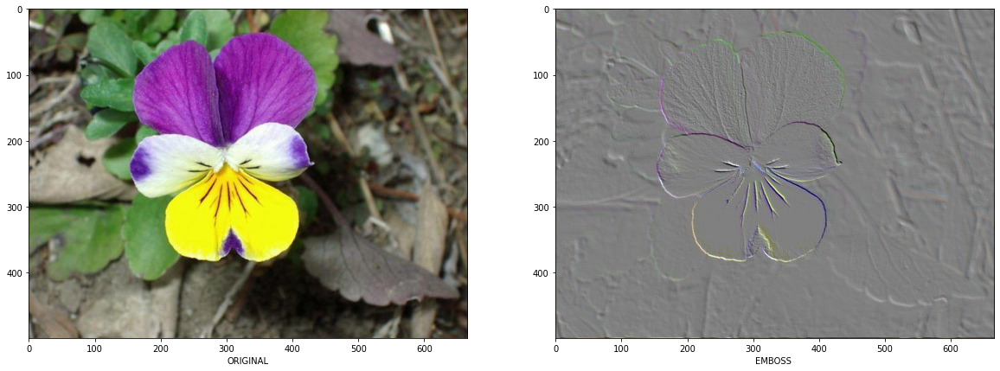

In [34]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(EMBOSS )
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('EMBOSS ')
plt.show()

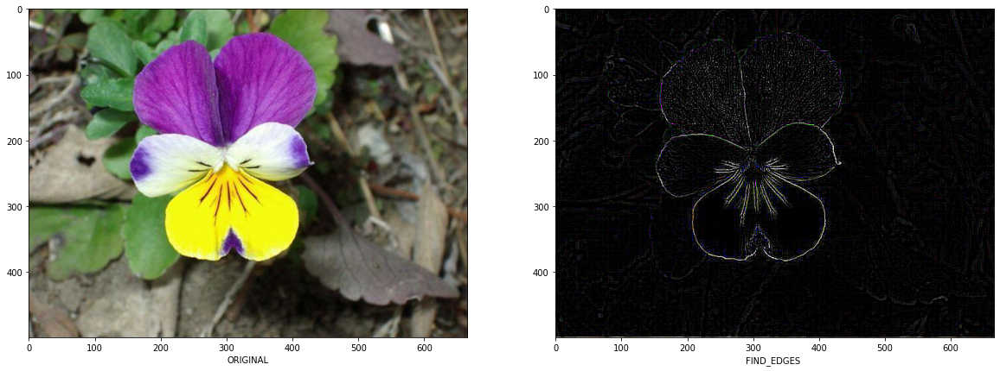

In [35]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(FIND_EDGES )
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('FIND_EDGES ')
plt.show()

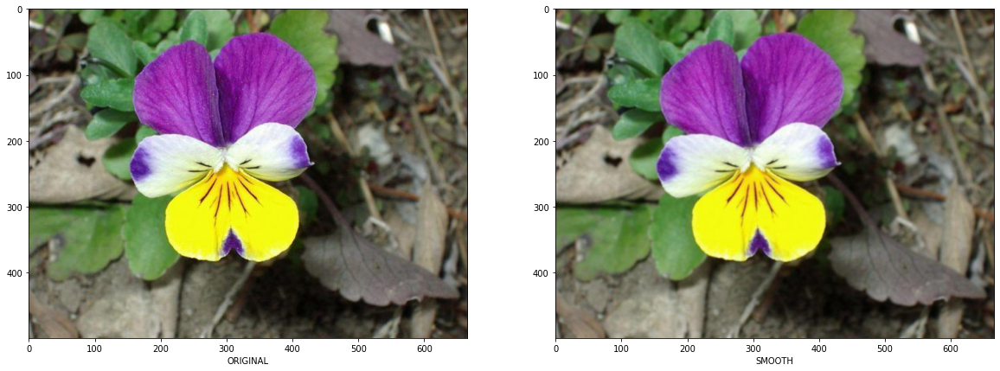

In [36]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(SMOOTH)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('SMOOTH')
plt.show()

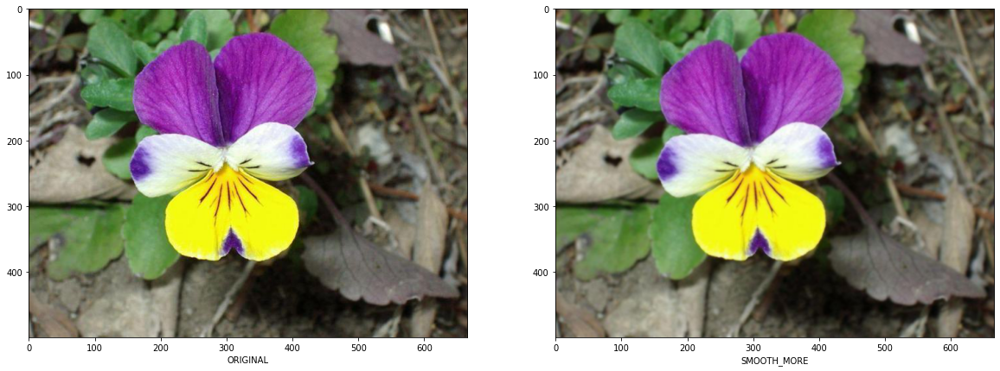

In [37]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(SMOOTH_MORE)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('SMOOTH_MORE')
plt.show()

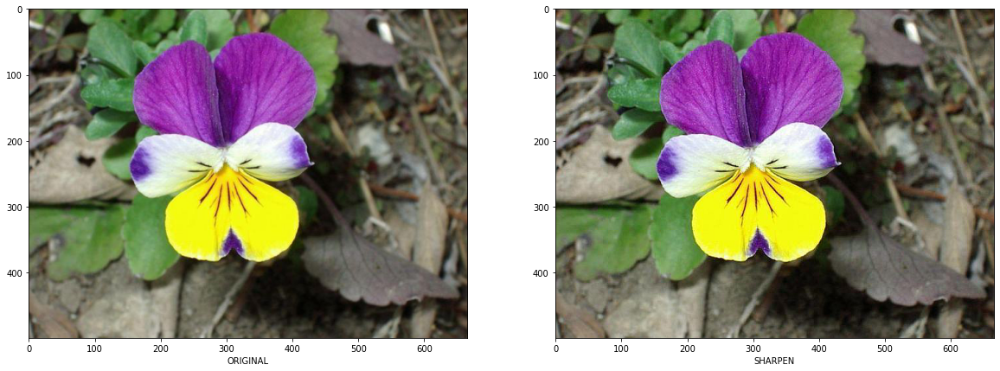

In [38]:
plt.figure(figsize = (20, 20))
img = Image.open(Image_name)
img1 = img.filter(SHARPEN)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.xlabel('ORIGINAL')
plt.subplot(2, 2, 2)
plt.imshow(img1)
plt.xlabel('SHARPEN')
plt.show()

### <font color=blue>4. Train tune and test AIML image classifier model</font>

##### <font color=blue>Creating dataframe for storing the accuracies of models</font>

In [25]:
col_names = ['Model', 'Accuracy']
resultsdf = pd.DataFrame(columns = col_names)
print(resultsdf)

Empty DataFrame
Columns: [Model, Accuracy]
Index: []


##### <font color=blue>Supervised Learning</font>

In [26]:
print("Training data shape : ", X_train.shape)
print("Training label shape : ", y_train.shape)

Training data shape :  (1088, 224, 224, 3)
Training label shape :  (1088, 17)


##### <font color=blue>Flattening Data</font>

In [27]:
numberOfSamples, lengthOfImage, widthOfImage, numberOfChannels = X_train.shape
X_train_flattened = X_train.reshape((numberOfSamples, lengthOfImage * widthOfImage * numberOfChannels))
numberOfSamples, lengthOfImage, widthOfImage, numberOfChannels = X_test.shape
X_test_flattened = X_test.reshape((numberOfSamples, lengthOfImage * widthOfImage * numberOfChannels))

##### <font color=blue>Shape After Flattening</font>

In [28]:
print("Shape ater flattening : ", X_train_flattened.shape)
print("Shape ater flattening : ", X_test_flattened.shape)

Shape ater flattening :  (1088, 150528)
Shape ater flattening :  (272, 150528)


##### <font color=blue>Using Multinomial Naive Bayes</font>

In [60]:
mnb = MultinomialNB()
mnb.fit(X_train_flattened, (np.argmax(y_train, axis = -1)))
pred = mnb.predict(X_test_flattened)
print("Accuracy Score of training set: {}".format(accuracy_score(np.argmax(y_train, axis=1),mnb.predict(X_train_flattened)))) 
print("Accuracy Score of testing set: {}".format(accuracy_score(np.argmax(y_test, axis=1),pred)))

Accuracy Score of training set: 0.5009191176470589
Accuracy Score of testing set: 0.3382352941176471


##### <font color=blue>Predicting one image</font>


Predicition is => 7 : Tulip


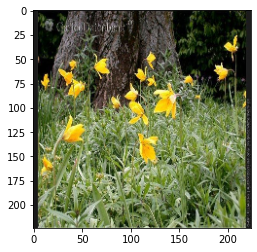

In [61]:
print("Predicition is => {0} : {1}".format( pred[7], flower_classes[pred[7]]))

flower = X_test[7].reshape(img_size, img_size, 3)
plt.imshow(flower)
plt.show()

##### <font color=blue>Adding Multinomial Naive Beyes final accuracy value to results dataframe</font>

In [62]:
tempResultsDf = pd.DataFrame({'Model':['Multinomial Naive Beyes'],'Accuracy': (accuracy_score(np.argmax(y_test, axis = 1), pred))}, index = {'1'})
resultsdf = pd.concat([resultsdf, tempResultsDf])
resultsdf

,Model,Accuracy
1,Multinomial Naive Beyes,0.338235


### <font color=blue>Neural Networks</font>

##### <font color=blue>Using ImageDataGenerator to avoid the overfitting problem</font>

In [32]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range = 50,  
                                                          width_shift_range = 0.1,  
                                                          height_shift_range = 0.1,  
                                                          horizontal_flip = True, 
                                                          shear_range = 0.2,
                                                          zoom_range = 0.2,  
                                                          fill_mode = "nearest")  

datagen.fit(X_train)

In [33]:
tf.keras.backend.clear_session()

# Initialize Sequential model
nn = tf.keras.models.Sequential()
# Input layer 
nn.add(tf.keras.layers.Dense(64, activation = 'relu', input_shape = (img_size, img_size, img_depth)))
# Normalize the data
nn.add(tf.keras.layers.BatchNormalization())
# Dense Layer
nn.add(tf.keras.layers.Dense(128, activation = 'relu'))
# Normalize the data
nn.add(tf.keras.layers.BatchNormalization())
# Flatten layer
nn.add(tf.keras.layers.Flatten())
# Dense Layer
nn.add(tf.keras.layers.Dense(32, activation = 'relu'))
# Normalize the data
nn.add(tf.keras.layers.BatchNormalization())
#Output layer
nn.add(tf.keras.layers.Dense(nClasses, activation = 'softmax'))

#Configuring the model for training
nn.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.


In [34]:
nn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 224, 224, 64)      256       
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 64)      256       
_________________________________________________________________
dense_1 (Dense)              (None, 224, 224, 128)     8320      
_________________________________________________________________
batch_normalization_1 (Batch (None, 224, 224, 128)     512       
_________________________________________________________________
flatten (Flatten)            (None, 6422528)           0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                205520928 
_________________________________________________________________
batch_normalization_2 (Batch (None, 32)                1

In [35]:
nn.fit(datagen.flow(X_train, y_train, batch_size = 64),
                  steps_per_epoch = X_train.shape[0]/32,
                  epochs = 10,
                  validation_data = (X_test, y_test))

Epoch 1/10
34/34 [==============================] - 22s 525ms/step - batch: 16.5000 - size: 64.0000 - loss: 2.6934 - acc: 0.2045 - val_loss: 2.8481 - val_acc: 0.0699
Epoch 2/10
34/34 [==============================] - 22s 660ms/step - batch: 16.5000 - size: 64.0000 - loss: 2.2389 - acc: 0.2937 - val_loss: 2.9095 - val_acc: 0.0515
Epoch 3/10
34/34 [==============================] - 23s 679ms/step - batch: 16.5000 - size: 64.0000 - loss: 1.9488 - acc: 0.3819 - val_loss: 2.9613 - val_acc: 0.0735
Epoch 4/10
34/34 [==============================] - 22s 671ms/step - batch: 16.5000 - size: 64.0000 - loss: 1.6871 - acc: 0.4660 - val_loss: 3.0149 - val_acc: 0.0625
Epoch 5/10
34/34 [==============================] - 22s 660ms/step - batch: 16.5000 - size: 64.0000 - loss: 1.4853 - acc: 0.5280 - val_loss: 3.1176 - val_acc: 0.0551
Epoch 6/10
34/34 [==============================] - 23s 689ms/step - batch: 16.5000 - size: 64.0000 - loss: 1.3470 - acc: 0.5777 - val_loss: 3.2453 - val_acc: 0.0588
Epoc

##### <font color=blue>Neural Network Accuracy</font>

In [37]:
loss, acc = nn.evaluate(X_train, y_train, verbose = 0)
print('Train Accuracy: %.3f%%' % (acc*100))
print('Train Loss: %.3f'% loss)
print()

loss, acc = nn.evaluate(X_test, y_test, verbose=0)
print('Test Accuracy: %.3f%%' % (acc*100))
print('Test Loss: %.3f'% loss)

Train Accuracy: 5.974%
Train Loss: 3.956

Test Accuracy: 5.882%
Test Loss: 4.021


##### <font color=blue>Adding Neural Network final accuracy value to results dataframe</font>

In [63]:
tempResultsDf = pd.DataFrame({'Model':['Neural Network'],'Accuracy': nn.evaluate(X_test, y_test, verbose = 0)[1]}, index = {'2'})
resultsdf = pd.concat([resultsdf, tempResultsDf])
resultsdf

,Model,Accuracy
1,Multinomial Naive Beyes,0.338235
2,Neural Network,0.058824


### <font color=blue>CNN</font>

In [76]:
tf.keras.backend.clear_session()

cnn = tf.keras.models.Sequential()


cnn.add(tf.keras.layers.Conv2D(32,  
                               kernel_size = (3, 3),      
                               activation = 'elu',
                               input_shape = (img_size, img_size, img_depth)))


cnn.add(tf.keras.layers.MaxPool2D(pool_size = (2, 2)))


cnn.add(tf.keras.layers.Conv2D(32,   
                               kernel_size = (3, 3),  
                               activation = 'elu', padding = 'same'))

cnn.add(tf.keras.layers.Conv2D(64,   
                               kernel_size = (3, 3),  
                               activation = 'elu', padding = 'same'))


cnn.add(tf.keras.layers.MaxPool2D(pool_size = (2, 2)))

cnn.add(tf.keras.layers.Dropout(0.25))

cnn.add(tf.keras.layers.Flatten())

cnn.add(tf.keras.layers.Dense(256, activation = 'elu'))

cnn.add(tf.keras.layers.Dropout(0.25))

cnn.add(tf.keras.layers.Dense(512, activation = 'elu'))

cnn.add(tf.keras.layers.Dropout(0.25))

cnn.add(tf.keras.layers.Dense(1024, activation = 'elu'))   

cnn.add(tf.keras.layers.Dropout(0.25))

cnn.add(tf.keras.layers.Dense(num_classes, activation = 'softmax'))


cnn.compile(optimizer = tf.keras.optimizers.Adam(lr = 0.001), 
              loss = 'categorical_crossentropy', 
              metrics = ['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_acc', patience = 5, verbose = 1, mode = 'auto')
callback_list = [early_stopping]

In [77]:
cnn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 111, 111, 32)      9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 111, 111, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 55, 55, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 55, 55, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 193600)            0

In [78]:
cnn.fit(datagen.flow(X_train, y_train, batch_size = 64),
                    steps_per_epoch = X_train.shape[0]/32,
                    epochs = 10,
                    validation_data = (X_test, y_test),
                    callbacks = callback_list)

Epoch 1/10
34/34 [==============================] - 22s 634ms/step - batch: 16.5000 - size: 64.0000 - loss: 3.7320 - acc: 0.1870 - val_loss: 1.9711 - val_acc: 0.3456
Epoch 2/10
34/34 [==============================] - 22s 652ms/step - batch: 16.5000 - size: 64.0000 - loss: 2.0393 - acc: 0.3608 - val_loss: 1.4729 - val_acc: 0.5110
Epoch 3/10
34/34 [==============================] - 22s 659ms/step - batch: 16.5000 - size: 64.0000 - loss: 1.7277 - acc: 0.4430 - val_loss: 1.5046 - val_acc: 0.5147
Epoch 4/10
34/34 [==============================] - 22s 648ms/step - batch: 16.5000 - size: 64.0000 - loss: 1.6499 - acc: 0.4770 - val_loss: 1.4512 - val_acc: 0.5110
Epoch 5/10
34/34 [==============================] - 22s 648ms/step - batch: 16.5000 - size: 64.0000 - loss: 1.5304 - acc: 0.5188 - val_loss: 1.5290 - val_acc: 0.5000
Epoch 6/10
34/34 [==============================] - 23s 664ms/step - batch: 16.5000 - size: 64.0000 - loss: 1.4367 - acc: 0.5326 - val_loss: 1.3448 - val_acc: 0.5919
Epoc

##### <font color=blue>CNN Accuracy</font>

In [79]:
loss, acc = cnn.evaluate(X_train, y_train, verbose = 0)
print('Train Accuracy: %.3f%%' % (acc*100))
print('Train Loss: %.3f'% loss)
print()

loss, acc = cnn.evaluate(X_test, y_test, verbose=0)
print('Test Accuracy: %.3f%%' % (acc*100))
print('Test Loss: %.3f'% loss)

Train Accuracy: 70.221%
Train Loss: 0.872

Test Accuracy: 57.353%
Test Loss: 1.441


##### <font color=blue>Adding Neural Network final accuracy value to results dataframe</font>

In [85]:
tempResultsDf = pd.DataFrame({'Model':['CNN'], 'Accuracy': cnn.evaluate(X_test, y_test, verbose=0)[1]}, index = {'3'})
resultsdf = pd.concat([resultsdf, tempResultsDf])
resultsdf

,Model,Accuracy
1,Multinomial Naive Beyes,0.338235
2,Neural Network,0.058824
3,CNN,0.573529


### <font color=blue>Use various CNN with transferred learning models for training</font>

In [177]:
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size = 0.2, shuffle = True, random_state = 42, stratify = y_new)
X_train_new, y_train_new = shuffle(X_train_new, y_train_new)
y_train_new = tf.keras.utils.to_categorical(y_train_new)
y_test_new = tf.keras.utils.to_categorical(y_test_new)

##### <font color=blue>Defining ImageDataGenerator</font>
##### <font color=blue>First Defining Training Data Generator with augmentations</font>
##### <font color=blue>Then Defining Test Data Generator with NO augmentations</font>
##### <font color=blue>Preparing the training generator</font>
##### <font color=blue>Preparing the testing generator</font>

In [179]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(featurewise_center = True,
                                                                featurewise_std_normalization = True,
                                                                rotation_range = 30,  
                                                                width_shift_range = 0.1,  
                                                                height_shift_range = 0.1,  
                                                                horizontal_flip = True, 
                                                                shear_range = 0.2,
                                                                zoom_range = 0.2,  
                                                                fill_mode = "nearest"                                                                                                                                
                                                               )  

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator()
train_datagen.fit(X_train_new)
test_datagen.fit(X_test_new)

##### <font color=blue>Loading Pre-trained model</font>

In [180]:
resnet_cnn = tf.keras.applications.ResNet50(weights = 'imagenet', include_top = False, input_shape = (img_size, img_size, img_depth))

In [181]:
print(len(resnet_cnn.layers))

175


##### <font color=blue>Freeze all the layers except for the last layer</font>

In [182]:
for layer in resnet_cnn.layers[:-4]:
    layer.trainable = False

In [183]:
resnet_cnn.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_7[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

##### <font color=blue>Creating Model</font>

In [184]:
model = tf.keras.models.Sequential()

##### <font color=blue>Add the resnet convolutional base model</font>

In [185]:
model.add(resnet_cnn)

##### <font color=blue>Adding Dense Layer</font>

In [186]:
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(1024, activation = 'elu', kernel_regularizer = tf.keras.regularizers.l1_l2(l1 = 0.00001, l2 = 0.00001)))
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(num_classes, activation = 'softmax'))
model.summary() 

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
flatten_5 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dense_10 (Dense)             (None, 1024)              102761472 
_________________________________________________________________
dropout_5 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_11 (Dense)             (None, 17)                17425     
Total params: 126,366,609
Trainable params: 103,833,617
Non-trainable params: 22,532,992
_________________________________________________________________


In [187]:
model.compile(loss = 'categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(lr = 2e-4),   
              metrics=['acc', 'top_k_categorical_accuracy'])

In [172]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
flatten_4 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dense_8 (Dense)              (None, 1024)              102761472 
_________________________________________________________________
dropout_4 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 17)                17425     
Total params: 126,366,609
Trainable params: 103,833,617
Non-trainable params: 22,532,992
_________________________________________________________________


In [188]:
os.chdir("/content/drive/MyDrive/Colab Notebooks/Computer Vision Assignment/CNN_Assignment02_SavedModel/")
os.getcwd()

'/content/drive/MyDrive/Colab Notebooks/Computer Vision Assignment/CNN_Assignment02_SavedModel'

In [189]:
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('oxflower17_resnet50.h5', 
                                                    save_best_only = True, 
                                                    monitor = 'val_acc', 
                                                    mode = 'max', 
                                                    verbose = 1)

In [191]:
history = model.fit(train_datagen.flow(X_train_new, y_train_new,batch_size = 32),
                epochs = 10,
                steps_per_epoch = X_train_new.shape[0]/32,
                validation_data = test_datagen.flow(X_test_new, y_test_new),
                validation_steps = X_test_new.shape[0]/32, 
                callbacks = [model_checkpoint])

Epoch 1/10
34/34 [==============================] - ETA: 0s - batch: 16.5000 - size: 32.0000 - loss: 5.1107 - acc: 0.8263 - top_k_categorical_accuracy: 0.9669
Epoch 00001: val_acc improved from 0.61397 to 0.77941, saving model to oxflower17_resnet50.h5
34/34 [==============================] - 19s 560ms/step - batch: 16.5000 - size: 32.0000 - loss: 5.1107 - acc: 0.8263 - top_k_categorical_accuracy: 0.9669 - val_loss: 5.4480 - val_acc: 0.7794 - val_top_k_categorical_accuracy: 0.9596
Epoch 2/10
34/34 [==============================] - ETA: 0s - batch: 16.5000 - size: 32.0000 - loss: 4.3995 - acc: 0.8713 - top_k_categorical_accuracy: 0.9844
Epoch 00002: val_acc improved from 0.77941 to 0.81985, saving model to oxflower17_resnet50.h5
34/34 [==============================] - 14s 433ms/step - batch: 16.5000 - size: 32.0000 - loss: 4.3995 - acc: 0.8713 - top_k_categorical_accuracy: 0.9844 - val_loss: 4.9676 - val_acc: 0.8199 - val_top_k_categorical_accuracy: 0.9779
Epoch 3/10
34/34 [==========

##### <font color=blue>RESNET50 Accuracy</font>

In [193]:
model.evaluate(X_test_new,y_test_new,batch_size=64, verbose = 2)

[4.905738325680003, 0.7683824, 0.9632353]

##### <font color=blue>Plotting</font>

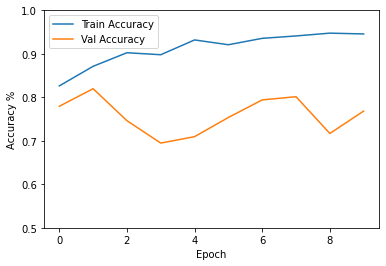

In [195]:
def plot_history(history):
 plt.figure()
 plt.xlabel('Epoch')
 plt.ylabel('Accuracy %')
 plt.plot(history.epoch, np.array(history.history['acc']),
 label='Train Accuracy')
 plt.plot(history.epoch, np.array(history.history['val_acc']),
 label = 'Val Accuracy')
 plt.legend()
 plt.ylim([0.5, 1])

plot_history(history)

##### <font color=blue>Adding Resnet Transfer Learning accuracy value to results dataframe</font>

In [200]:
tempResultsDf = pd.DataFrame({'Model':['ResNet50'], 'Accuracy': model.evaluate(X_test_new, y_test_new, verbose = 0)[1]}, index={'4'})
resultsdf = pd.concat([resultsdf, tempResultsDf])

### <font color=blue>Compare the results from the above step along with your detailed observations</font>

In [202]:
resultsdf

,Model,Accuracy
1,Multinomial Naive Beyes,0.338235
2,Neural Network,0.058824
3,CNN,0.573529
4,ResNet50,0.768382


#### <font color=blue>Inferences</font>

1. Multinomial Naive Beyes or the supervised algorithm gives the least score among other models 
2. Deep Neural Nets is better than supervised learning as its good at extracting features which helps in improving the accuracy. 
Major issue with DNN is that it has large number of weights as each layer gets added which becomes computationally intensive.
3. CNN has better accuracy than DNN as convolution helps in extracting features from images, which then is flattened and feeded to a dense layer for output.
Still, CNN accuracy is not good.
4. Transfer learning with ResNet50 is used as it comes with pretrained model trained on a very large dataset which helps to achieve bettter accuracy.


### <font color=blue>Explain in depth your strategy to maintain and support the AIML image classifier after it in production</font>

1. Save all the predictions made by the model.
2. Carefully study and analyze the predictions made by model.
3. Re-train the model after adding the saved predictions to train data (and for additional features) at regular interval.
4. Deploy the new model and repeat the process from Step 1. This will ensure that the model is refined on regular basis.

# <font color=blue>END</font>